In [1]:
from typing import TypedDict
import datetime as dt

import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import pyproj
import scipy
import etas.mc_b_est as mc_b_est
import etas.simulation as simulation
from etas.inversion import polygon_surface
from matplotlib import colors
from matplotlib.path import Path
from scipy.optimize import root_scalar
from shapely.geometry import MultiPoint, MultiPolygon, Point, Polygon
from shapely.ops import transform, voronoi_diagram
from shapely.prepared import prep
from tqdm.auto import tqdm


2026-06-08 15:58:54.085941: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-08 15:58:54.121979: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-06-08 15:58:54.122020: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-06-08 15:58:54.123482: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-06-08 15:58:54.130163: I tensorflow/core/platform/cpu_feature_guar

In [2]:
class History(TypedDict):
    m: float
    x: float
    y: float
    t: float

class EtasParams(TypedDict):
    mu: float
    k0: float
    a: float
    m_c: float
    d: float
    gamma: float
    rho: float
    c: float
    tau: float
    omega: float

def a_h(
    x: float,
    y: float,
    H : History,
    params: EtasParams,
    ):
    return params['k0'] * np.exp(params['a'] * (H['m'] - params['m_c'])) \
        / ((x-H['x'])**2 + (y-H['y'])**2 + params['d']*np.exp(params['gamma'] * (H['m'] - params['m_c'])))**(1+params['rho'])   


def A_h(poly: Polygon, H: History, params: EtasParams, resolution: int = 50) -> float:
    "A fast way to integrate a_h over a polygon"
    minx, miny, maxx, maxy = poly.bounds
    
    x_grid = np.linspace(minx, maxx, resolution)
    y_grid = np.linspace(miny, maxy, resolution)
    X, Y = np.meshgrid(x_grid, y_grid)

    # Fast point-in-polygon check
    points = np.column_stack((X.ravel(), Y.ravel()))
    path = Path(poly.exterior.coords)
    mask = path.contains_points(points).reshape(resolution, resolution)

    K = params['k0'] * np.exp(params['a'] * (H['m'] - params['m_c']))
    C = params['d'] * np.exp(params['gamma'] * (H['m'] - params['m_c']))
    rho1 = 1 + params['rho']
    
    # Evaluate kernel strictly inside the masked polygon
    Z = np.zeros_like(X)
    X_masked = X[mask]
    Y_masked = Y[mask]
    
    Z[mask] = K / ((X_masked - H['x'])**2 + (Y_masked - H['y'])**2 + C)**rho1

    dx = (maxx - minx) / (resolution - 1)
    dy = (maxy - miny) / (resolution - 1)

    return np.sum(Z) * dx * dy

def g(
    t: float,
    H : History,
    params: EtasParams,
    ):
    return np.exp(-(t - H['t']) / params['tau']) / (t - H['t'] + params['c'])**(1+params['omega'])

def rate(
    x: float,
    y: float,
    t: float,
    H : History,
    params: EtasParams,
    ):
    return params['mu']  + a_h(x, y, H, params) * g(t, H, params)

def unreg_gamma(a, x):
    return scipy.special.gammaincc(a, x) * scipy.special.gamma(a)


In [3]:
THETA_0 = {
    "log10_mu": -5.8,
    "log10_k0": -2.6,
    "a": 1.8,
    "log10_c": -2.5,
    "omega": -0.02,
    "log10_tau": 3.5,
    "log10_d": -0.85,
    "gamma": 1.3,
    "rho": 0.66,
    "m_c": 3.5,
}

for key in list(THETA_0.keys()):
    if key.startswith('log10_'):
        xx = key.replace('log10_', '')
        if xx not in THETA_0:
            THETA_0[xx] = 10 ** THETA_0[key]


THETA_0


{'log10_mu': -5.8,
 'log10_k0': -2.6,
 'a': 1.8,
 'log10_c': -2.5,
 'omega': -0.02,
 'log10_tau': 3.5,
 'log10_d': -0.85,
 'gamma': 1.3,
 'rho': 0.66,
 'm_c': 3.5,
 'mu': 1.584893192461114e-06,
 'k0': 0.0025118864315095794,
 'c': 0.0031622776601683794,
 'tau': 3162.2776601683795,
 'd': 0.14125375446227545}

In [4]:
history_event_time = "2006-12-29 00:00:00"
history_event_magnitude = 6.5
history_event_x = -116.4
history_event_y = 33.6

history_dict = {
    "m": history_event_magnitude,
    "x": history_event_x,
    "y": history_event_y,
    "t": (pd.to_datetime(history_event_time) - pd.Timestamp("1970-01-01")) / pd.Timedelta("1D"),
}


In [5]:
# Hardcoded study-region outline (same vertices as input_data/california_shape.npy)
# Each row is [latitude, longitude].
SHAPE_COORDS = [[43.5, -125.7], [43.5, -118.5], [39.7, -118.5], [36.1, -113.6], [34.6, -112.6], [34.3, -112.6], [32.7, -113.1], [31.8, -113.2], [31.2, -114.5], [31.0, -117.1], [31.1, -117.4], [31.5, -118.3], [32.4, -118.8], [33.3, -121.3], [34.0, -122.0], [37.5, -124.3], [40.0, -125.9], [40.5, -125.9], [43.0, -125.7], [43.5, -125.7]]

GRID_POINT_DENSITY_KM2 = 5e-4  # same as grid_recreations_point_process.ipynb


In [6]:
EARTH_RADIUS_KM = 6.3781e3


def _hav(theta):
    return np.square(np.sin(theta / 2))


def haversine_km(lat_rad_1, lat_rad_2, lon_rad_1, lon_rad_2, earth_radius=EARTH_RADIUS_KM):
    return (
        2
        * earth_radius
        * np.arcsin(
            np.sqrt(
                _hav(lat_rad_1 - lat_rad_2)
                + np.cos(lat_rad_1) * np.cos(lat_rad_2) * _hav(lon_rad_1 - lon_rad_2)
            )
        )
    )


def km_per_degree_at_latitude(lat_deg, earth_radius=EARTH_RADIUS_KM):
    lat_rad = np.radians(np.asarray(lat_deg, dtype=float))
    km_per_lat = haversine_km(
        lat_rad - np.radians(0.5), lat_rad + np.radians(0.5), 0.0, 0.0, earth_radius
    )
    km_per_lon = haversine_km(lat_rad, lat_rad, 0.0, np.radians(1.0), earth_radius)
    if np.ndim(km_per_lat) == 0:
        return float(km_per_lat), float(km_per_lon)
    return km_per_lat, km_per_lon


def latlon_rectangular_grid_in_polygon(
    polygon,
    grid_point_density_km2,
    *,
    earth_radius=EARTH_RADIUS_KM,
    rtol=0.05,
    max_iterations=40,
):
    if grid_point_density_km2 <= 0:
        raise ValueError("grid_point_density_km2 must be positive")
    area_km2 = float(polygon_surface(polygon))
    target_n = max(1, int(round(area_km2 * grid_point_density_km2)))
    min_lat, min_lon, max_lat, max_lon = polygon.bounds
    lat_c = 0.5 * (min_lat + max_lat)
    km_per_lat, km_per_lon = km_per_degree_at_latitude(lat_c, earth_radius)
    prep_poly = prep(polygon)
    spacing_km = float(np.sqrt(area_km2 / target_n))
    lat_flat = lon_flat = np.empty(0)
    n_lat = n_lon = 0
    for _ in range(max_iterations):
        spacing_lat = spacing_km / km_per_lat
        spacing_lon = spacing_km / km_per_lon
        n_lat = max(2, int(np.ceil((max_lat - min_lat) / spacing_lat)) + 1)
        n_lon = max(2, int(np.ceil((max_lon - min_lon) / spacing_lon)) + 1)
        lats = np.linspace(min_lat, max_lat, n_lat)
        lons = np.linspace(min_lon, max_lon, n_lon)
        lat_mesh, lon_mesh = np.meshgrid(lats, lons)
        lat_cand = lat_mesh.ravel()
        lon_cand = lon_mesh.ravel()
        inside = np.fromiter(
            (prep_poly.contains(Point(lat, lon)) for lat, lon in zip(lat_cand, lon_cand)),
            dtype=bool,
            count=lat_cand.size,
        )
        n_inside = int(inside.sum())
        if n_inside == 0:
            spacing_km *= 0.5
            continue
        lat_flat = lat_cand[inside]
        lon_flat = lon_cand[inside]
        if abs(n_inside - target_n) / target_n <= rtol:
            break
        spacing_km *= np.sqrt(n_inside / target_n)
    if lat_flat.size == 0:
        raise RuntimeError("Could not place any grid nodes inside the polygon")
    info = {
        "area_km2": area_km2,
        "target_n": target_n,
        "n_points": int(lat_flat.size),
        "spacing_km": spacing_km,
        "grid_n_xy": (n_lat, n_lon),
        "grid_point_density_km2": float(grid_point_density_km2),
    }
    return lat_flat, lon_flat, info


def _swap_xy(x, y):
    return y, x


def get_ordered_voronoi_cells(polygon_latlon, lat_flat, lon_flat):
    # Swap bounding polygon to standard (lon, lat)
    polygon_lonlat = transform(_swap_xy, polygon_latlon)

    # Create ordered points
    points = [Point(lon, lat) for lon, lat in zip(lon_flat, lat_flat)]

    # Generate raw Voronoi diagram
    vd = voronoi_diagram(MultiPoint(points), envelope=polygon_lonlat)
    raw_cells = list(vd.geoms)

    # Use spatial join to map the unordered cells back to the exact order of input points
    points_gdf = gpd.GeoDataFrame(geometry=points)
    cells_gdf = gpd.GeoDataFrame(geometry=raw_cells)
    matched = points_gdf.sjoin(cells_gdf, how="left", predicate="intersects")
    matched = matched[~matched.index.duplicated(keep="first")]

    ordered_clipped_cells = []
    for idx in matched["index_right"].values:
        if np.isnan(idx):
            # Point is completely orphaned/outside
            ordered_clipped_cells.append(Polygon())
        else:
            # Extract matched cell and clip it to the overarching polygon boundary
            cell = raw_cells[int(idx)]
            clipped_cell = cell.intersection(polygon_lonlat)
            ordered_clipped_cells.append(clipped_cell)

    return ordered_clipped_cells


In [7]:
polygon = Polygon(SHAPE_COORDS)

lat_flat, lon_flat, grid_info = latlon_rectangular_grid_in_polygon(
    polygon, GRID_POINT_DENSITY_KM2
)
ordered_cells = get_ordered_voronoi_cells(polygon, lat_flat, lon_flat)

print(
    f"grid from density {GRID_POINT_DENSITY_KM2:.4g} pts/km²: "
    f"{grid_info['n_points']} nodes (target {grid_info['target_n']}, "
    f"spacing {grid_info['spacing_km']:.3f} km, rectangle {grid_info['grid_n_xy']})"
)
print(f"polygon area: {grid_info['area_km2']:.4g} km²")
print(f"Voronoi cells: {len(ordered_cells)}")

history_point = Point(history_event_x, history_event_y)
for j, cell in enumerate(ordered_cells):
    if cell.contains(history_point):
        print(
            f"history point ({history_event_x}, {history_event_y}) -> cell {j}, "
            f"node ({lon_flat[j]:.6f}, {lat_flat[j]:.6f})"
        )
        break


grid from density 0.0005 pts/km²: 494 nodes (target 480, spacing 44.717 km, rectangle (33, 28))
polygon area: 9.598e+05 km²
Voronoi cells: 494
history point (-116.4, 33.6) -> cell 390, node (-116.540741, 33.734375)


2026-06-08 15:58:56,271 - DEBUG - Loaded backend inline version unknown.
2026-06-08 15:58:56,276 - DEBUG - findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
2026-06-08 15:58:56,276 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 15:58:56,277 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 15:58:56,277 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-pa

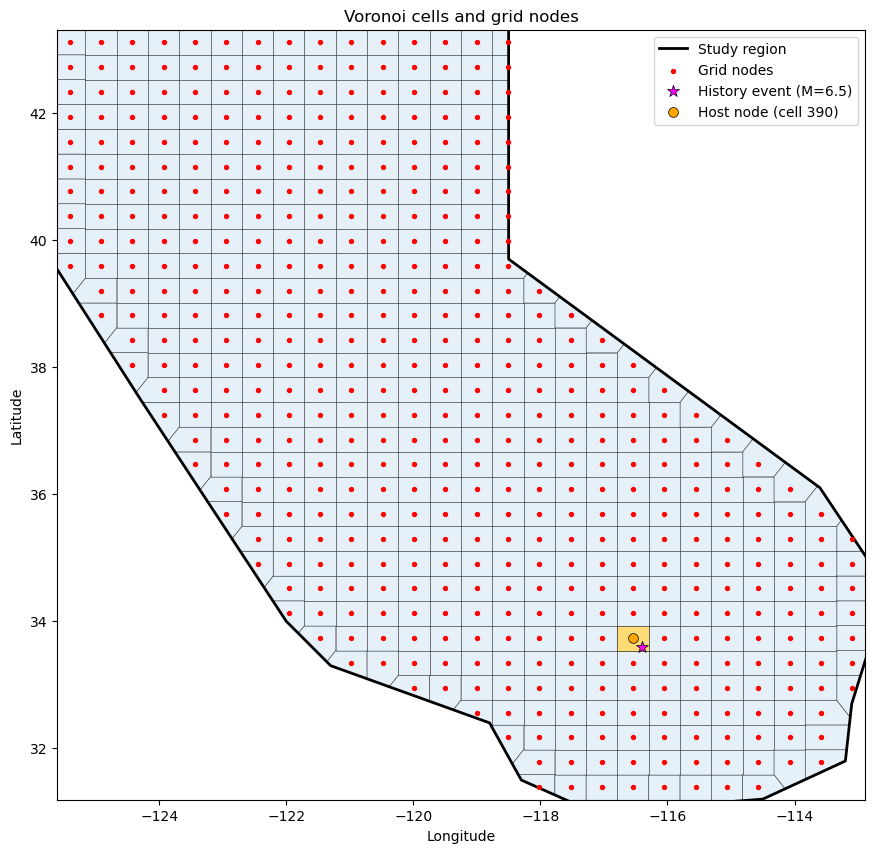

In [8]:
%matplotlib inline



def _polygon_parts(geom):
    if geom.is_empty:
        return
    if geom.geom_type == "Polygon":
        yield geom
    elif geom.geom_type == "MultiPolygon":
        yield from geom.geoms
    elif geom.geom_type == "GeometryCollection":
        for g in geom.geoms:
            yield from _polygon_parts(g)


history_cell_idx = None
for j, cell in enumerate(ordered_cells):
    if cell.contains(history_point):
        history_cell_idx = j
        break

fig_grid, ax = plt.subplots(figsize=(12, 10))

for j, cell in enumerate(ordered_cells):
    facecolor = "#ffd966" if j == history_cell_idx else "#d9e8f7"
    alpha = 0.9 if j == history_cell_idx else 0.65
    for part in _polygon_parts(cell):
        xy = np.asarray(part.exterior.coords)  # x=lon, y=lat
        ax.add_patch(
            mpatches.Polygon(
                xy,
                closed=True,
                facecolor=facecolor,
                edgecolor="k",
                alpha=alpha,
                linewidth=0.4,
            )
        )

poly_coords = np.asarray(polygon.exterior.coords)
lat_poly, lon_poly = poly_coords[:, 0], poly_coords[:, 1]
ax.plot(lon_poly, lat_poly, color="black", linewidth=2, label="Study region")

ax.scatter(lon_flat, lat_flat, s=8, c="red", zorder=5, label="Grid nodes")
ax.scatter(
    [history_event_x],
    [history_event_y],
    s=80,
    c="magenta",
    marker="*",
    edgecolors="black",
    linewidths=0.5,
    zorder=6,
    label=f"History event (M={history_event_magnitude})",
)

if history_cell_idx is not None:
    ax.scatter(
        [lon_flat[history_cell_idx]],
        [lat_flat[history_cell_idx]],
        s=50,
        c="orange",
        edgecolors="black",
        linewidths=0.5,
        zorder=6,
        label=f"Host node (cell {history_cell_idx})",
    )

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Voronoi cells and grid nodes")
ax.set_aspect("equal")
ax.set_xlim(np.min(lon_flat) - 0.2, np.max(lon_flat) + 0.2)
ax.set_ylim(np.min(lat_flat) - 0.2, np.max(lat_flat) + 0.2)
ax.legend(loc="upper right")
plt.show()


2026-06-08 15:58:57,235 - DEBUG - locator: <matplotlib.ticker.LogLocator object at 0x725c4756b590>
2026-06-08 15:58:57,292 - DEBUG - vmin 0.027802505587401865 vmax 5.989852018735492
2026-06-08 15:58:57,292 - DEBUG - ticklocs array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02])
2026-06-08 15:58:57,295 - DEBUG - vmin 0.027802505587401865 vmax 5.989852018735492
2026-06-08 15:58:57,295 - DEBUG - ticklocs array([2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02])
2026-06-08 15:58:57,296 - DEBUG - vmin 0.027802505587401865 vmax 5.989852018735492
2026-06-08 15:58:57,296 - DEBUG - ticklocs array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1

2026-06-08 15:59:01,586 - DEBUG - findfont: score(FontEntry(fname='/usr/share/fonts/opentype/cabin/Cabin-MediumItalic.otf', name='Cabin', style='italic', variant='normal', weight=500, stretch='normal', size='scalable')) = 11.145
2026-06-08 15:59:01,586 - DEBUG - findfont: score(FontEntry(fname='/usr/share/fonts/truetype/noto/NotoSansOldPersian-Regular.ttf', name='Noto Sans Old Persian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 15:59:01,586 - DEBUG - findfont: score(FontEntry(fname='/usr/share/fonts/truetype/liberation2/LiberationSerif-Regular.ttf', name='Liberation Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 15:59:01,587 - DEBUG - findfont: score(FontEntry(fname='/usr/share/fonts/truetype/freefont/FreeSerifBoldItalic.ttf', name='FreeSerif', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
2026-06-08 15:59:01,587 - DEBUG -

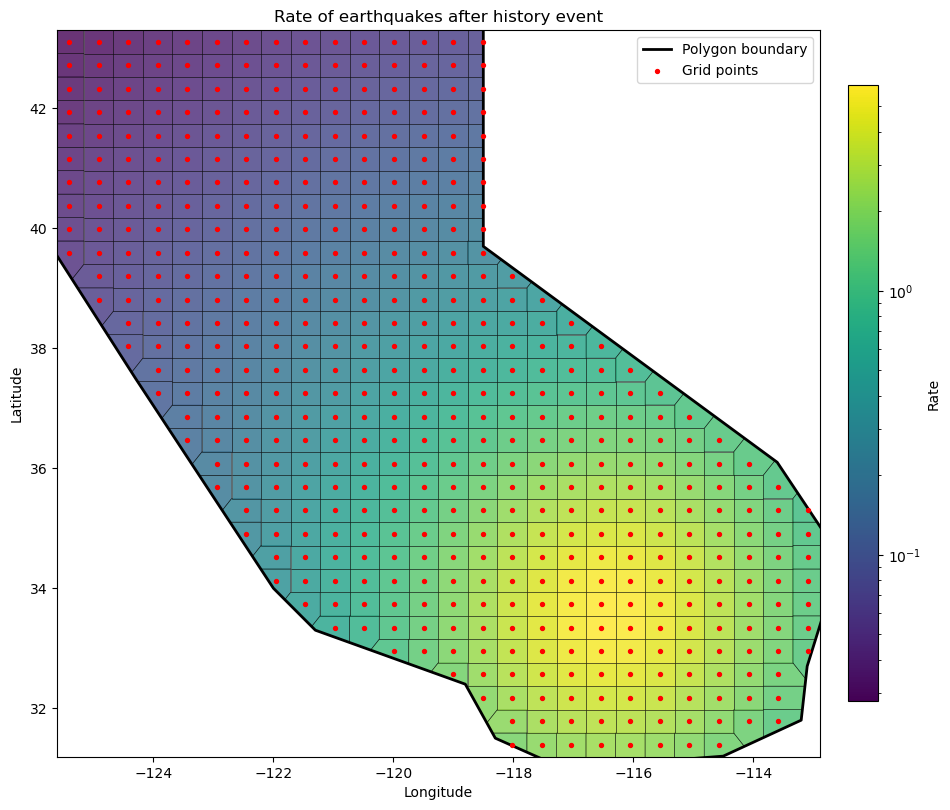

In [9]:
# calculate rate for each grid point after history event
epsilon = 1e-4
rates = rate(lon_flat, lat_flat, history_dict["t"] + epsilon, history_dict, THETA_0)



def _polygon_parts(geom):
    if geom.is_empty:
        return
    if geom.geom_type == "Polygon":
        yield geom
    elif geom.geom_type == "MultiPolygon":
        yield from geom.geoms
    elif geom.geom_type == "GeometryCollection":
        for g in geom.geoms:
            yield from _polygon_parts(g)


# Same clipped Voronoi cells as grid_recreations_point_process.ipynb (fig_rate cell).
fig, ax = plt.subplots(figsize=(12, 10))
norm = colors.LogNorm(vmin=np.min(rates), vmax=np.max(rates))
cmap = plt.cm.viridis

for j, cell in enumerate(ordered_cells):
    color = cmap(norm(rates[j]))
    for part in _polygon_parts(cell):
        xy = np.asarray(part.exterior.coords)  # x=lon, y=lat
        ax.add_patch(
            mpatches.Polygon(
                xy,
                closed=True,
                facecolor=color,
                edgecolor="k",
                alpha=0.8,
                linewidth=0.4,
            )
        )

poly_coords = np.asarray(polygon.exterior.coords)
lat_poly, lon_poly = poly_coords[:, 0], poly_coords[:, 1]
ax.plot(lon_poly, lat_poly, color="black", linewidth=2, label="Polygon boundary")

ax.scatter(lon_flat, lat_flat, s=8, c="red", zorder=5, label="Grid points")

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.03)
cbar.set_label("Rate")

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Rate of earthquakes after history event")
ax.set_aspect("equal")
ax.set_xlim(np.min(lon_flat) - 0.2, np.max(lon_flat) + 0.2)
ax.set_ylim(np.min(lat_flat) - 0.2, np.max(lat_flat) + 0.2)
ax.legend()
plt.show()


## Catalog continuation forecast

Run classic ETAS catalog continuation (`simulate_catalog_continuation`) from forecast start time **T**, using only the single history event above as auxiliary catalog. Each recreation keeps the **first forecast event** after **T** (extending the forecast window if needed).

In [10]:
# --- forecast settings (edit these) ---
FORECAST_START = history_event_time  # time T: forecast window starts here
N_RECREATIONS = 1000
N_FORECAST_EVENTS = 1  # keep the first event after T in each recreation
SEED_START = 0

# initial forecast window; extended automatically until N_FORECAST_EVENTS are found
INITIAL_FORECAST_DAYS = 30
MAX_FORECAST_DAYS = 3650
FORECAST_GROWTH_FACTOR = 2.0

# magnitude distribution (Gutenberg–Richter b=1 => beta = ln(10))
BETA_MAIN = np.log(10)
MC = THETA_0["m_c"]


In [11]:
# ETAS parameters in the log10 form expected by simulate_catalog_continuation
theta = {
    key: THETA_0[key]
    for key in [
        "log10_mu",
        "log10_k0",
        "a",
        "log10_c",
        "omega",
        "log10_tau",
        "log10_d",
        "gamma",
        "rho",
    ]
}


def _to_naive_utc(ts):
    t = pd.to_datetime(ts, utc=True)
    return t.tz_convert(None)


def simulate_single_event_recreations(
    auxiliary_catalog,
    *,
    auxiliary_start,
    forecast_start,
    polygon,
    theta,
    mc,
    beta_main,
    n_events,
    n_recreations,
    seed_start,
    initial_forecast_days=30,
    max_forecast_days=3650,
    growth_factor=2.0,
):
    """Call simulate_catalog_continuation; keep first n_events after forecast_start."""
    aux_start = _to_naive_utc(auxiliary_start)
    f_start = _to_naive_utc(forecast_start)

    aux = auxiliary_catalog.copy()
    aux["time"] = pd.to_datetime(aux["time"], utc=True).dt.tz_convert(None)

    records = []
    seeds = range(seed_start, seed_start + n_recreations)
    for i, seed in enumerate(
        tqdm(seeds, total=n_recreations, desc="Recreations", unit="run")
    ):
        np.random.seed(int(seed))

        forecast_days = float(initial_forecast_days)
        chosen = None
        while forecast_days <= float(max_forecast_days):
            sim_end = f_start + dt.timedelta(days=forecast_days)

            cont = simulation.simulate_catalog_continuation(
                auxiliary_catalog=aux,
                auxiliary_start=aux_start,
                auxiliary_end=f_start,
                polygon=polygon,
                simulation_end=sim_end,
                parameters=dict(theta),
                mc=float(mc),
                beta_main=beta_main,
                filter_polygon=False,
                magnitude_generator=mc_b_est.simulate_magnitudes,
            )

            cont = cont.copy()
            cont["time"] = pd.to_datetime(cont["time"], utc=True).dt.tz_convert(None)

            forecast_events = cont.loc[cont["time"] > f_start].sort_values("time")
            forecast_events = forecast_events.head(int(n_events))

            if len(forecast_events) >= int(n_events):
                chosen = forecast_events
                break

            forecast_days *= float(growth_factor)

        if chosen is None:
            raise RuntimeError(
                f"Recreation {i} (seed={seed}) did not reach {n_events} event(s) "
                f"within {max_forecast_days} forecast days."
            )

        chosen = chosen[["time", "latitude", "longitude", "magnitude"]].copy()
        chosen["recreation"] = i
        chosen["seed"] = int(seed)
        chosen["event_idx"] = np.arange(len(chosen), dtype=int)
        records.append(chosen)

    if not records:
        return pd.DataFrame(
            columns=[
                "time",
                "latitude",
                "longitude",
                "magnitude",
                "recreation",
                "seed",
                "event_idx",
            ]
        )
    return pd.concat(records, ignore_index=True)


auxiliary_catalog = pd.DataFrame(
    {
        "time": [_to_naive_utc(history_event_time)],
        "latitude": [history_event_y],
        "longitude": [history_event_x],
        "magnitude": [history_event_magnitude],
        "xi_plus_1": [1.0],
    }
)
auxiliary_start = auxiliary_catalog["time"].min()
forecast_start = _to_naive_utc(FORECAST_START)

forecast_recreations = simulate_single_event_recreations(
    auxiliary_catalog,
    auxiliary_start=auxiliary_start,
    forecast_start=forecast_start,
    polygon=polygon,
    theta=theta,
    mc=MC,
    beta_main=BETA_MAIN,
    n_events=N_FORECAST_EVENTS,
    n_recreations=N_RECREATIONS,
    seed_start=SEED_START,
    initial_forecast_days=INITIAL_FORECAST_DAYS,
    max_forecast_days=MAX_FORECAST_DAYS,
    growth_factor=FORECAST_GROWTH_FACTOR,
)

print(
    f"Forecast from T={forecast_start}: "
    f"{len(forecast_recreations)} event(s) "
    f"({forecast_recreations['recreation'].nunique()} recreations x {N_FORECAST_EVENTS})"
)
forecast_recreations


Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

2026-06-08 15:59:03,421 - INFO -   number of background events needed: 47
2026-06-08 15:59:03,421 - INFO -   generating 96 to throw away those outside the polygon
2026-06-08 15:59:03,427 - DEBUG - number of induced events: 0
2026-06-08 15:59:03,430 - DEBUG - number of background events: 47
2026-06-08 15:59:03,431 - DEBUG - number of auxiliary events: 1
2026-06-08 15:59:03,431 - DEBUG - generation 0
2026-06-08 15:59:03,434 - DEBUG - number of events with aftershocks: 30
2026-06-08 15:59:03,442 - DEBUG - number of aftershocks: 37
2026-06-08 15:59:03,443 - DEBUG - their number of aftershocks should be:31
2026-06-08 15:59:03,444 - DEBUG - generation 1
2026-06-08 15:59:03,446 - DEBUG - number of events with aftershocks: 19
2026-06-08 15:59:03,454 - DEBUG - number of aftershocks: 19
2026-06-08 15:59:03,454 - DEBUG - their number of aftershocks should be:14
2026-06-08 15:59:03,455 - DEBUG - generation 2
2026-06-08 15:59:03,457 - DEBUG - number of events with aftershocks: 9
2026-06-08 15:59:03

,time,latitude,longitude,magnitude,recreation,seed,event_idx
0,2006-12-29 00:04:33.384782147,33.640841,-116.390571,4.446771,0,0,0
1,2006-12-29 00:01:27.373472342,33.606112,-116.410896,4.255075,1,1,0
2,2006-12-29 00:01:29.696643390,33.609112,-116.404300,4.140123,2,2,0
3,2006-12-29 00:02:25.783504304,33.614555,-116.365436,4.030258,3,3,0
4,2006-12-29 01:14:22.885729140,33.598656,-116.409180,3.517818,4,4,0
...,...,...,...,...,...,...,...
995,2006-12-29 00:43:01.613004968,33.579169,-116.383727,3.819263,995,995,0
996,2006-12-29 00:02:26.394538047,33.599709,-116.411527,3.733496,996,996,0
997,2006-12-29 00:08:18.770315478,33.644308,-116.373536,3.925489,997,997,0
998,2006-12-29 00:13:22.786741801,33.621556,-116.412113,4.930851,998,998,0


2026-06-08 16:12:59,517 - DEBUG - findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0.
2026-06-08 16:12:59,517 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 16:12:59,518 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-08 16:12:59,518 - DEBUG - findfont: score(FontEntry(fname='/a/home/cc/students/csguests/neriberman/anaconda3/envs/etas_remote/lib/python3.11/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono.ttf', name='DejaVu San

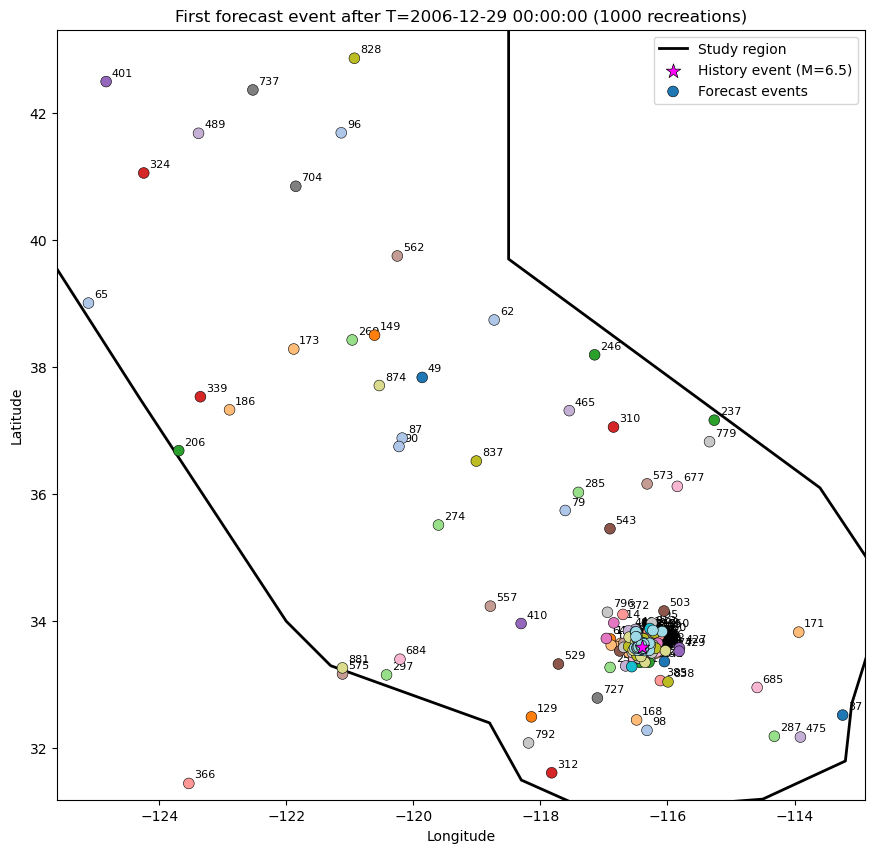

In [12]:
fig_forecast, ax = plt.subplots(figsize=(12, 10))

poly_coords = np.asarray(polygon.exterior.coords)
lat_poly, lon_poly = poly_coords[:, 0], poly_coords[:, 1]
ax.plot(lon_poly, lat_poly, color="black", linewidth=2, label="Study region")

ax.scatter(
    [history_event_x],
    [history_event_y],
    s=120,
    c="magenta",
    marker="*",
    edgecolors="black",
    linewidths=0.5,
    zorder=6,
    label=f"History event (M={history_event_magnitude})",
)

ax.scatter(
    forecast_recreations["longitude"],
    forecast_recreations["latitude"],
    s=60,
    c=forecast_recreations["recreation"],
    cmap="tab20",
    edgecolors="black",
    linewidths=0.4,
    zorder=5,
    label="Forecast events",
)

for _, row in forecast_recreations.iterrows():
    ax.annotate(
        str(int(row["recreation"])),
        (row["longitude"], row["latitude"]),
        textcoords="offset points",
        xytext=(4, 4),
        fontsize=8,
    )

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title(f"First forecast event after T={FORECAST_START} ({N_RECREATIONS} recreations)")
ax.set_aspect("equal")
ax.set_xlim(np.min(lon_flat) - 0.2, np.max(lon_flat) + 0.2)
ax.set_ylim(np.min(lat_flat) - 0.2, np.max(lat_flat) + 0.2)
ax.legend(loc="upper right")
plt.show()


Binned 1000 simulated event(s) from 1000 recreations over 30 day forecast window.
Non-zero cells: 58 / 494; max count in one cell: 854
2026-06-08 16:13:52,078 - DEBUG - locator: <matplotlib.ticker.LogLocator object at 0x725c3fea3590>
2026-06-08 16:13:52,116 - DEBUG - vmin 3.896731370250758e-07 vmax 0.0004317821198702578
2026-06-08 16:13:52,117 - DEBUG - ticklocs array([1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02])
2026-06-08 16:13:52,120 - DEBUG - vmin 3.896731370250758e-07 vmax 0.0004317821198702578
2026-06-08 16:13:52,120 - DEBUG - ticklocs array([2.e-08, 3.e-08, 4.e-08, 5.e-08, 6.e-08, 7.e-08, 8.e-08, 9.e-08,
       2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e-05, 9.e-05,
       2.e-04, 3.e-04, 4.e-04, 5.e-04, 6.e-04, 7.e-04, 8.e-04, 9.e-04,
       2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02,

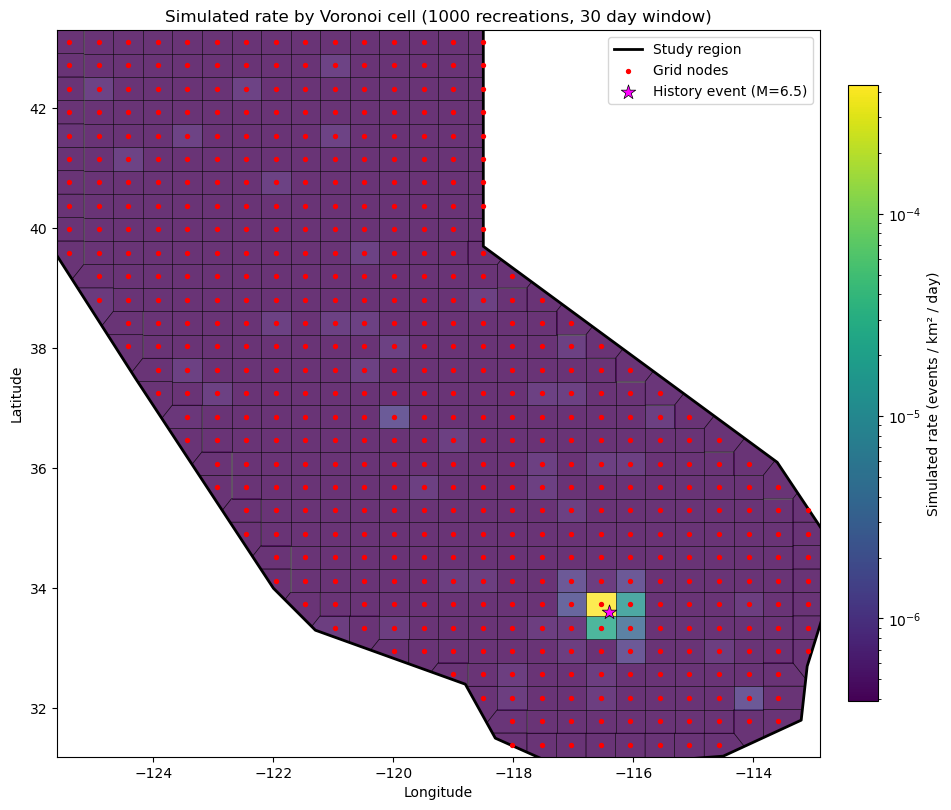

In [13]:
# Empirical rate per Voronoi cell from catalog-continuation recreations


def _polygon_parts(geom):
    if geom.is_empty:
        return
    if geom.geom_type == "Polygon":
        yield geom
    elif geom.geom_type == "MultiPolygon":
        yield from geom.geoms
    elif geom.geom_type == "GeometryCollection":
        for g in geom.geoms:
            yield from _polygon_parts(g)


def calculate_areas_km2(polygons):
    geod = pyproj.Geod(ellps="WGS84")
    areas = []
    for poly in polygons:
        if poly.is_empty:
            areas.append(0.0)
        else:
            area_m2, _ = geod.geometry_area_perimeter(poly)
            areas.append(abs(area_m2) / 1e6)
    return areas


sim_events = (
    forecast_recreations.sort_values(["recreation", "time"])
    .groupby("recreation", as_index=False)
    .head(N_FORECAST_EVENTS)
)

counts_per_cell = np.zeros(len(ordered_cells), dtype=int)
for lon, lat in zip(sim_events["longitude"].to_numpy(), sim_events["latitude"].to_numpy()):
    p = Point(lon, lat)
    for j, cell in enumerate(ordered_cells):
        if cell.contains(p):
            counts_per_cell[j] += 1
            break

cell_areas_km2 = np.array(calculate_areas_km2(ordered_cells), dtype=float)
forecast_days = float(INITIAL_FORECAST_DAYS)
n_realizations = int(sim_events["recreation"].nunique())

# events / km² / day
sim_rate_per_cell = np.zeros(len(ordered_cells), dtype=float)
valid = cell_areas_km2 > 0
sim_rate_per_cell[valid] = counts_per_cell[valid] / (
    # n_realizations * forecast_days * cell_areas_km2[valid]
    n_realizations * cell_areas_km2[valid]
)

print(
    f"Binned {len(sim_events)} simulated event(s) from {n_realizations} recreations "
    f"over {forecast_days:.0f} day forecast window."
)
print(
    f"Non-zero cells: {(counts_per_cell > 0).sum()} / {len(ordered_cells)}; "
    f"max count in one cell: {counts_per_cell.max()}"
)

fig_sim_rate, ax = plt.subplots(figsize=(12, 10))
positive_rates = sim_rate_per_cell[sim_rate_per_cell > 0]
rate_vmin = float(positive_rates.min()) if positive_rates.size else 1e-20
rate_vmax = float(max(sim_rate_per_cell.max(), rate_vmin * 10))
plot_rate = np.maximum(sim_rate_per_cell, rate_vmin)
norm = colors.LogNorm(vmin=rate_vmin, vmax=rate_vmax)
cmap = plt.cm.viridis

for j, cell in enumerate(ordered_cells):
    color = cmap(norm(plot_rate[j]))
    for part in _polygon_parts(cell):
        xy = np.asarray(part.exterior.coords)
        ax.add_patch(
            mpatches.Polygon(
                xy,
                closed=True,
                facecolor=color,
                edgecolor="k",
                alpha=0.8,
                linewidth=0.4,
            )
        )

poly_coords = np.asarray(polygon.exterior.coords)
lat_poly, lon_poly = poly_coords[:, 0], poly_coords[:, 1]
ax.plot(lon_poly, lat_poly, color="black", linewidth=2, label="Study region")
ax.scatter(lon_flat, lat_flat, s=8, c="red", zorder=5, label="Grid nodes")
ax.scatter(
    [history_event_x],
    [history_event_y],
    s=120,
    c="magenta",
    marker="*",
    edgecolors="black",
    linewidths=0.5,
    zorder=6,
    label=f"History event (M={history_event_magnitude})",
)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.03)
cbar.set_label("Simulated rate (events / km² / day)")

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title(
    f"Simulated rate by Voronoi cell "
    f"({n_realizations} recreations, {forecast_days:.0f} day window)"
)
ax.set_aspect("equal")
ax.set_xlim(np.min(lon_flat) - 0.2, np.max(lon_flat) + 0.2)
ax.set_ylim(np.min(lat_flat) - 0.2, np.max(lat_flat) + 0.2)
ax.legend(loc="upper right")
plt.show()


2026-06-08 16:13:52,838 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:52,838 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
2026-06-08 16:13:52,841 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:52,842 - DEBUG - ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02,
       2.e+03, 3.e+03, 4.e+03, 5.e+03, 6.e+03, 7.e+03, 8.e+03, 9.e+03,
       2.e+04, 3.e+04, 4.e+04, 5.e+04, 6.e+04, 7.e+04, 8.e+04, 9.e+04])
2026-06-08 16:13:52,842 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:52,843 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
20

2026-06-08 16:13:53,039 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:53,039 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
2026-06-08 16:13:53,040 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:53,040 - DEBUG - ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02,
       2.e+03, 3.e+03, 4.e+03, 5.e+03, 6.e+03, 7.e+03, 8.e+03, 9.e+03,
       2.e+04, 3.e+04, 4.e+04, 5.e+04, 6.e+04, 7.e+04, 8.e+04, 9.e+04])
2026-06-08 16:13:53,040 - DEBUG - vmin 0.23856448897109564 vmax 581.587592595913
2026-06-08 16:13:53,041 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
20

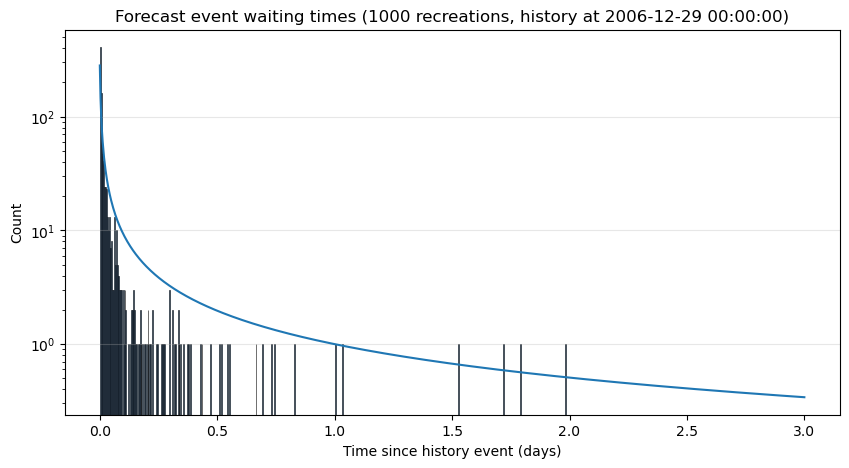

count    1000.000000
mean        0.040286
std         0.144411
min         0.000009
25%         0.001771
50%         0.005688
75%         0.020616
max         1.985531
Name: time, dtype: float64

In [14]:
# Histogram of waiting time since the history event
history_time = pd.to_datetime(history_event_time, utc=True).tz_convert(None)
event_times = pd.to_datetime(forecast_recreations["time"], utc=True).dt.tz_convert(None)

delta_t_days = (event_times - history_time).dt.total_seconds() / 86400.0

fig_delta_t, ax = plt.subplots(figsize=(10, 5))
ax.hist(delta_t_days, bins="auto", color="#4c78a8", edgecolor="black", linewidth=0.4)
ax.set_xlabel("Time since history event (days)")
ax.set_ylabel("Count")
ax.set_title(
    f"Forecast event waiting times "
    f"({len(delta_t_days)} recreations, history at {history_event_time})"
)
ax.grid(axis="y", alpha=0.3)


t_vec = np.linspace(0, 3, 1000)
ax.plot(t_vec, g(t_vec+history_dict['t'], history_dict, THETA_0))

ax.set_yscale('log')
plt.show()

delta_t_days.describe()


# Simulate times on the grid

In [15]:
# def rhs(t_prime, t, H, params):
#     t_h = H['t']
#     rhs = np.exp(-params['mu'] * (t_prime - t)) * np.exp(
#         A_h(H['x'], H['y'], H, params) * (
#             np.exp(params["c"]/params["tau"]) / params['tau']**(-params['omega'])
#             ) * (
#                 unreg_gamma(-params['omega'], (params['c'] + t_prime - t_h) / params['tau']) -
#                 unreg_gamma(-params['omega'], (params['c'] + t - t_h) / params['tau'])
#                 )
#         )
#     return rhs

def log_rhs(t_prime: float, t: float, target_polygon: Polygon, H: History, params: EtasParams, resolution: int = 50):
    """
    Computes the log-space right-hand side for numerical stability.
    """
    t_h = H['t']
    
    # Linear background term
    term1 = -params['mu'] * (t_prime - t)
    
    # Non-linear triggering term
    gamma_diff = (
        unreg_gamma(-params['omega'], (params['c'] + t_prime - t_h) / params['tau']) -
        unreg_gamma(-params['omega'], (params['c'] + t - t_h) / params['tau'])
    )
    
    const_multiplier = np.exp(params['c'] / params['tau']) / (params['tau']**(-params['omega']))
    term2 = A_h(target_polygon, H, params, resolution) * const_multiplier * gamma_diff
    
    return term1 + term2

def solve_next_event_time_per_cell(U: float, t: float, target_polygon: Polygon, H: History, params: EtasParams, resolution: int = 50):
    """
    Solves for t_prime using the log-space RHS and Brent's method.
    """
    target_val = np.log(U)
    
    def residual(t_prime):
        return log_rhs(t_prime, t, target_polygon, H, params, resolution) - target_val

    # Dynamic bracketing
    upper_bound = t + 1.0
    while residual(upper_bound) > 0:
        upper_bound = t + (upper_bound - t) * 2.0
        
    sol = root_scalar(residual, bracket=[t, upper_bound], method='brentq')
    return sol.root 


In [16]:
rng = np.random.RandomState(1905)
U = rng.uniform()
root = solve_next_event_time_per_cell(U, history_dict['t'], ordered_cells[0], history_dict, THETA_0) 
root


714016.2632208995

In [17]:
## create a single realization of the point process
def create_single_realization(
    rng: np.random.RandomState,
    history_dict: History,
    ordered_cells: list[Polygon],
    lon_flat: np.ndarray,
    lat_flat: np.ndarray,
    epsilon: float,
    resolution: int = 50,
) -> dict:
    ordered_event_times = []
    for cell in ordered_cells:
        U = rng.uniform()
        t_prime = solve_next_event_time_per_cell(
            U, history_dict["t"] + epsilon, cell, history_dict, THETA_0, resolution
        )
        ordered_event_times.append(t_prime)

    min_index = int(np.argmin(ordered_event_times))
    min_event_time = ordered_event_times[min_index]
    magnitude = mc_b_est.simulate_magnitudes(1, BETA_MAIN, MC)[0]

    return {
        "time": min_event_time,
        "magnitude": magnitude,
        "longitude": float(lon_flat[min_index]),
        "latitude": float(lat_flat[min_index]),
        "cell_idx": min_index,
    }


In [ ]:
# n_recreations = N_RECREATIONS
# # n_recreations = 20
# RESOLUTION = 50
# rngseed = 1905
# recreations_df = pd.DataFrame()
# rng = np.random.RandomState(rngseed)
# for i in tqdm(range(n_recreations)):
#     # U = rng.uniform()
#     event_dict = create_single_realization(rng, history_dict, ordered_cells, lon_flat, lat_flat, RESOLUTION)
#     recreations_df = pd.concat([recreations_df, pd.DataFrame([event_dict])], ignore_index=True)
#     rngseed += 1
#     rng = np.random.RandomState(rngseed)
# recreations_df


  0%|          | 0/1000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [23]:
epsilon_vec = np.concatenate([np.array([0]), 10**np.arange(-4, 4, 2, dtype=float)])
n_recreations = N_RECREATIONS
# n_recreations = 100
RESOLUTION = 40
recreations_epsilon = {}

epsilon_pbar = tqdm(
    epsilon_vec,
    desc="Epsilon",
    position=0,
    unit="eps",
    dynamic_ncols=True,
)

for epsilon in epsilon_pbar:
    epsilon_pbar.set_postfix_str(f"ε={epsilon:g}")

    rngseed = 1905
    records = []
    rng = np.random.RandomState(rngseed)

    for i in tqdm(
        range(n_recreations),
        desc="Recreations",
        position=1,
        leave=False,
        unit="run",
        dynamic_ncols=True,
    ):
        event_dict = create_single_realization(
            rng,
            history_dict,
            ordered_cells,
            lon_flat,
            lat_flat,
            epsilon,
            RESOLUTION,
        )
        records.append(event_dict)
        rngseed += 1
        rng = np.random.RandomState(rngseed)

    recreations_epsilon[epsilon] = pd.DataFrame.from_records(records)

recreations_epsilon


Epsilon:   0%|          | 0/5 [00:00<?, ?eps/s]

Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

Recreations:   0%|          | 0/1000 [00:00<?, ?run/s]

{0.0:              time  magnitude   longitude   latitude  cell_idx
 0    13511.042015   3.543739 -116.540741  32.562500       387
 1    13511.002831   3.771462 -114.077778  31.781250       464
 2    13511.173123   3.733161 -118.511111  38.421875       311
 3    13511.002250   4.159310 -116.540741  37.250000       399
 4    13511.002245   3.879109 -115.555556  32.562500       422
 ..            ...        ...         ...        ...       ...
 995  13511.043379   3.770268 -117.033333  36.078125       377
 996  13511.011421   3.843602 -118.511111  34.515625       301
 997  13513.430359   3.521278 -115.555556  34.906250       428
 998  13809.666994   3.649932 -122.944444  37.640625        75
 999  13511.172598   5.852117 -116.540741  36.468750       397
 
 [1000 rows x 5 columns],
 9.999999999999999e-05:              time  magnitude   longitude   latitude  cell_idx
 0    13511.043368   3.578761 -116.540741  32.562500       387
 1    13511.003018   3.939524 -114.077778  31.781250       464

ε=0: binned 1000 events; non-zero cells 285/494; max count 19
ε=0.0001: binned 1000 events; non-zero cells 285/494; max count 19
ε=0.01: binned 1000 events; non-zero cells 291/494; max count 19
ε=1: binned 1000 events; non-zero cells 329/494; max count 17
ε=100: binned 1000 events; non-zero cells 405/494; max count 11
2026-06-08 18:46:42,737 - DEBUG - locator: <matplotlib.ticker.LogLocator object at 0x725c3c13ee50>
2026-06-08 18:46:42,850 - DEBUG - vmin 3.451207094342149e-07 vmax 9.606393767605122e-06
2026-06-08 18:46:42,851 - DEBUG - ticklocs array([1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04])
2026-06-08 18:46:42,853 - DEBUG - vmin 3.451207094342149e-07 vmax 9.606393767605122e-06
2026-06-08 18:46:42,853 - DEBUG - ticklocs array([2.e-08, 3.e-08, 4.e-08, 5.e-08, 6.e-08, 7.e-08, 8.e-08, 9.e-08,
       2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e

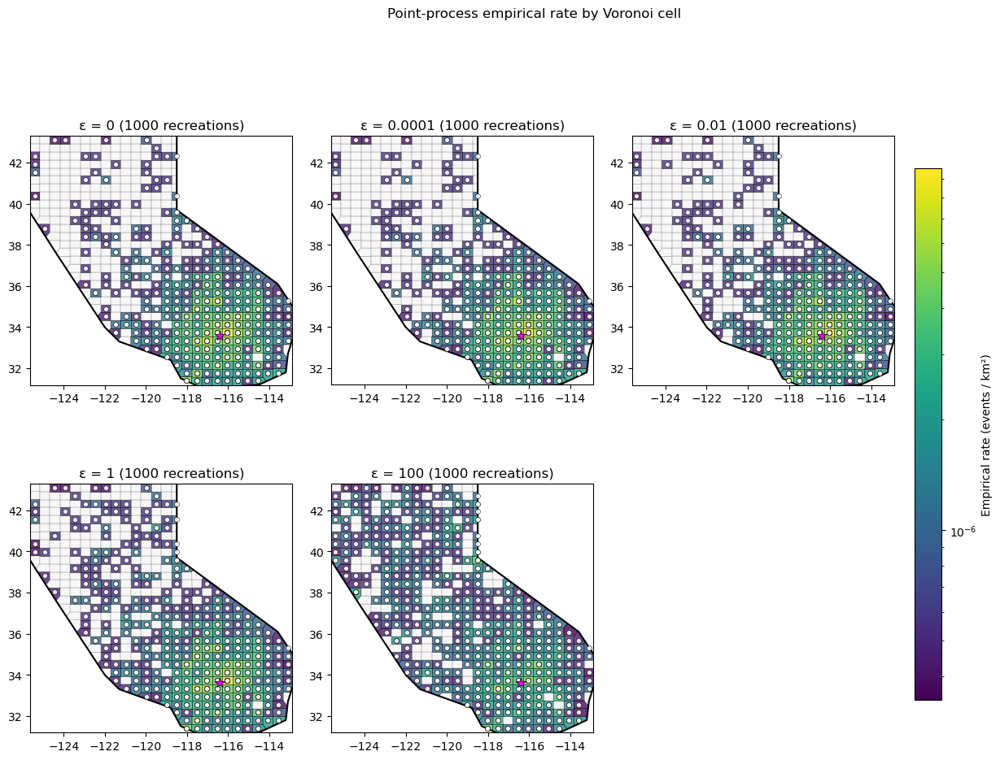

In [24]:
# Empirical rate per Voronoi cell for each epsilon in recreations_epsilon

if "_polygon_parts" not in globals():
    def _polygon_parts(geom):
        if geom.is_empty:
            return
        if geom.geom_type == "Polygon":
            yield geom
        elif geom.geom_type == "MultiPolygon":
            yield from geom.geoms
        elif geom.geom_type == "GeometryCollection":
            for g in geom.geoms:
                yield from _polygon_parts(g)

if "calculate_areas_km2" not in globals():
    def calculate_areas_km2(polygons):
        geod = pyproj.Geod(ellps="WGS84")
        areas = []
        for poly in polygons:
            if poly.is_empty:
                areas.append(0.0)
            else:
                area_m2, _ = geod.geometry_area_perimeter(poly)
                areas.append(abs(area_m2) / 1e6)
        return areas

if "cell_areas_km2" not in globals():
    cell_areas_km2 = np.array(calculate_areas_km2(ordered_cells), dtype=float)

poly_coords = np.asarray(polygon.exterior.coords)
lat_poly, lon_poly = poly_coords[:, 0], poly_coords[:, 1]
xlim = (np.min(lon_flat) - 0.2, np.max(lon_flat) + 0.2)
ylim = (np.min(lat_flat) - 0.2, np.max(lat_flat) + 0.2)


def _bin_events_to_cells(pp_events):
    counts = np.zeros(len(ordered_cells), dtype=int)
    if "cell_idx" in pp_events.columns:
        for idx in pp_events["cell_idx"].astype(int).to_numpy():
            counts[idx] += 1
    else:
        for lon, lat in zip(pp_events["longitude"].to_numpy(), pp_events["latitude"].to_numpy()):
            j = int(np.argmin((lon_flat - lon) ** 2 + (lat_flat - lat) ** 2))
            counts[j] += 1
    return counts


def _counts_to_rate(counts, n_realizations):
    rate = np.zeros(len(ordered_cells), dtype=float)
    valid = cell_areas_km2 > 0
    rate[valid] = counts[valid] / (n_realizations * cell_areas_km2[valid])
    return rate


def _draw_rate_map(ax, pp_events, counts, rate, *, title):
    occupied = counts > 0
    if not occupied.any():
        ax.text(0.5, 0.5, "No events binned", ha="center", va="center", transform=ax.transAxes)
        ax.set_title(title)
        return

    plot_rate = np.maximum(rate, rate_vmin)
    for j, cell in enumerate(ordered_cells):
        if occupied[j]:
            facecolor = cmap(norm(plot_rate[j]))
            edge_lw = 0.4
            alpha = 0.8
        else:
            facecolor = "#f0f0f0"
            edge_lw = 0.2
            alpha = 0.5
        for part in _polygon_parts(cell):
            xy = np.asarray(part.exterior.coords)
            ax.add_patch(
                mpatches.Polygon(
                    xy,
                    closed=True,
                    facecolor=facecolor,
                    edgecolor="k",
                    alpha=alpha,
                    linewidth=edge_lw,
                )
            )

    ax.plot(lon_poly, lat_poly, color="black", linewidth=1.5)
    ax.scatter(
        pp_events["longitude"],
        pp_events["latitude"],
        s=18,
        c="white",
        edgecolors="black",
        linewidths=0.4,
        alpha=0.9,
        zorder=7,
    )
    ax.scatter(
        [history_event_x],
        [history_event_y],
        s=80,
        c="magenta",
        marker="*",
        edgecolors="black",
        linewidths=0.5,
        zorder=8,
    )
    ax.set_title(title)
    ax.set_aspect("equal")
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)


epsilons = list(epsilon_vec) if "epsilon_vec" in globals() else sorted(recreations_epsilon.keys(), key=float)
epsilons = [eps for eps in epsilons if eps in recreations_epsilon]
if not epsilons:
    epsilons = sorted(recreations_epsilon.keys(), key=float)

rates_by_eps = {}
all_positive = []
for eps in epsilons:
    pp_events = recreations_epsilon[eps]
    counts = _bin_events_to_cells(pp_events)
    n_realizations_pp = len(pp_events)
    rate = _counts_to_rate(counts, n_realizations_pp)
    rates_by_eps[eps] = (pp_events, counts, rate, n_realizations_pp)
    positive = rate[counts > 0]
    if positive.size:
        all_positive.append(positive)

if not all_positive:
    raise ValueError("No events were assigned to any Voronoi cell.")

rate_vmin = float(np.min(np.concatenate(all_positive)))
rate_vmax = float(np.max(np.concatenate(all_positive)))
if rate_vmin == rate_vmax:
    rate_vmax = rate_vmin * 10.0
norm = colors.LogNorm(vmin=rate_vmin, vmax=rate_vmax)
cmap = plt.cm.viridis

n_eps = len(epsilons)
ncols = min(3, n_eps)
nrows = int(np.ceil(n_eps / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(5.5 * ncols, 5 * nrows), squeeze=False)

for idx, eps in enumerate(epsilons):
    ax = axes[idx // ncols, idx % ncols]
    pp_events, counts, rate, n_realizations_pp = rates_by_eps[eps]
    _draw_rate_map(
        ax,
        pp_events,
        counts,
        rate,
        title=f"ε = {eps:g} ({n_realizations_pp} recreations)",
    )
    print(
        f"ε={eps:g}: binned {len(pp_events)} events; "
        f"non-zero cells {(counts > 0).sum()}/{len(ordered_cells)}; "
        f"max count {counts.max()}"
    )

for idx in range(n_eps, nrows * ncols):
    axes[idx // ncols, idx % ncols].axis("off")

fig.subplots_adjust(right=0.9, hspace=0.25, wspace=0.15)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes.ravel().tolist(), shrink=0.85, pad=0.02)
cbar.set_label("Empirical rate (events / km²)")
fig.suptitle("Point-process empirical rate by Voronoi cell", y=1.02)
plt.show()


2026-06-08 22:38:08,162 - DEBUG - vmin 1.8491027731215581e-06 vmax 4686.972034675135
2026-06-08 22:38:08,162 - DEBUG - ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])
2026-06-08 22:38:08,168 - DEBUG - vmin 1.8491027731215581e-06 vmax 4686.972034675135
2026-06-08 22:38:08,168 - DEBUG - ticklocs array([2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e-05, 9.e-05,
       2.e-04, 3.e-04, 4.e-04, 5.e-04, 6.e-04, 7.e-04, 8.e-04, 9.e-04,
       2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.

2026-06-08 22:38:08,243 - DEBUG - vmin 0.8 vmax 231.14999999999998
2026-06-08 22:38:08,243 - DEBUG - ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02,
       2.e+03, 3.e+03, 4.e+03, 5.e+03, 6.e+03, 7.e+03, 8.e+03, 9.e+03,
       2.e+04, 3.e+04, 4.e+04, 5.e+04, 6.e+04, 7.e+04, 8.e+04, 9.e+04])
2026-06-08 22:38:08,244 - DEBUG - vmin 0.8 vmax 231.14999999999998
2026-06-08 22:38:08,244 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
2026-06-08 22:38:08,254 - DEBUG - vmin 0.8 vmax 231.14999999999998
2026-06-08 22:38:08,254 - DEBUG - ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04])
2026-06-08 22:38:08,254 - DEBUG - vmin 0.8 v

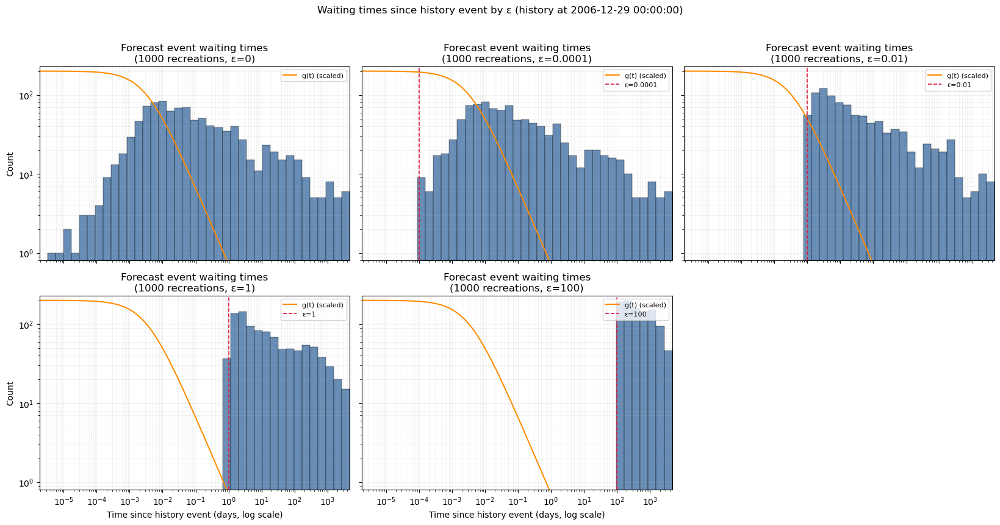

In [32]:
# Waiting-time histograms for each epsilon in recreations_epsilon
history_t_days = float(history_dict["t"])

epsilons = list(epsilon_vec) if "epsilon_vec" in globals() else sorted(recreations_epsilon.keys(), key=float)
epsilons = [eps for eps in epsilons if eps in recreations_epsilon]
if not epsilons:
    epsilons = sorted(recreations_epsilon.keys(), key=float)

delta_t_by_eps = {}
for eps in epsilons:
    pp_events = recreations_epsilon[eps]
    delta_t_by_eps[eps] = pp_events["time"].to_numpy() - history_t_days

all_delta_t = np.concatenate(list(delta_t_by_eps.values()))
positive_all = all_delta_t[all_delta_t > 0]
if positive_all.size == 0:
    raise ValueError("No positive waiting times to plot.")

xmax = max(1e-3, float(np.percentile(positive_all, 99.5)) * 1.1)
xmin = max(1e-6, float(np.min(positive_all)) * 0.5)
n_log_bins = 40
shared_bins = np.geomspace(xmin, xmax, n_log_bins)
t_plot = np.geomspace(xmin, xmax, 500)
g_vals = g(t_plot + history_t_days, history_dict, THETA_0)

max_count = 1
for eps in epsilons:
    positive = delta_t_by_eps[eps][delta_t_by_eps[eps] > 0]
    if positive.size:
        counts, _ = np.histogram(positive, bins=shared_bins)
        max_count = max(max_count, int(counts.max()))

g_scaled = g_vals * (max_count / max(g_vals.max(), 1e-30))
ymin = 0.8
ymax = max(max_count, float(g_scaled.max())) * 1.15

n_eps = len(epsilons)
ncols = min(3, n_eps)
nrows = int(np.ceil(n_eps / ncols))
fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(5.5 * ncols, 4.2 * nrows),
    squeeze=False,
    sharex=True,
    sharey=True,
)

for idx, eps in enumerate(epsilons):
    ax = axes[idx // ncols, idx % ncols]
    delta_t_days = delta_t_by_eps[eps]
    positive = delta_t_days[delta_t_days > 0]
    if positive.size == 0:
        ax.text(0.5, 0.5, "No positive waiting times", ha="center", va="center", transform=ax.transAxes)
        ax.set_title(f"ε = {eps:g}")
        continue

    ax.hist(
        positive,
        bins=shared_bins,
        color="#4c78a8",
        edgecolor="black",
        linewidth=0.35,
        alpha=0.85,
    )
    ax.plot(
        t_plot,
        g_scaled,
        color="darkorange",
        linewidth=1.5,
        label="g(t) (scaled)",
    )

    if eps > 0:
        ax.axvline(eps, color="crimson", linestyle="--", linewidth=1.2, label=f"ε={eps:g}")

    ax.set_title(
        f"Forecast event waiting times\n"
        f"({len(delta_t_days)} recreations, ε={eps:g})"
    )
    ax.grid(which="both", axis="both", alpha=0.25, linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

for idx in range(n_eps, nrows * ncols):
    axes[idx // ncols, idx % ncols].axis("off")

for ax in axes.ravel():
    if not ax.axison:
        continue
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_autoscalex_on(False)
    ax.set_autoscaley_on(False)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

for ax in axes[-1, :]:
    if ax.axison:
        ax.set_xlabel("Time since history event (days, log scale)")
for ax in axes[:, 0]:
    if ax.axison:
        ax.set_ylabel("Count")

fig.suptitle(
    f"Waiting times since history event by ε (history at {history_event_time})",
    y=1.02,
)
fig.tight_layout()
plt.show()
